# Fraud Detection with Machine Learning - Logistic Regression

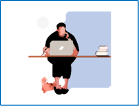

### Problem Statement
In this session, you will work on creditcard_sampledata.csv, a dataset containing credit card transactions data. The challenge here is to train a Logistic Regression model for Fraud detection and get the best possible performance. Please, explain everything you do and try to have a clean and structured code by using functions, classes, etc. Draw some conclussions from the results obtained.

OPTIONAL:
When you think you got the best possible performance with LR, you can try another method to improve the final results.

In [137]:
import pandas as pd
import numpy as np 
from sklearn.linear_model import LogisticRegression
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
from scipy.stats import skew
from pandas_visual_analysis import VisualAnalysis
import seaborn as sns
import re
import sys, getopt
import csv 

data = pd.read_csv("./session_6_creditcard_sampledata.csv")

### First look at the data

In [138]:
#Dataframe Checkup
print("Type of the imported data:", type(data))
print("\nDimensions: \nNumber of rows:",data.shape[0], "\nNumber of columns:",data.shape[1])
data

Type of the imported data: <class 'pandas.core.frame.DataFrame'>

Dimensions: 
Number of rows: 5050 
Number of columns: 31


,Unnamed: 0,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,258647,1.725265,-1.337256,-1.012687,-0.361656,-1.431611,-1.098681,-0.842274,-0.026594,-0.032409,...,0.414524,0.793434,0.028887,0.419421,-0.367529,-0.155634,-0.015768,0.010790,189.00,0
1,69263,0.683254,-1.681875,0.533349,-0.326064,-1.455603,0.101832,-0.520590,0.114036,-0.601760,...,0.116898,-0.304605,-0.125547,0.244848,0.069163,-0.460712,-0.017068,0.063542,315.17,0
2,96552,1.067973,-0.656667,1.029738,0.253899,-1.172715,0.073232,-0.745771,0.249803,1.383057,...,-0.189315,-0.426743,0.079539,0.129692,0.002778,0.970498,-0.035056,0.017313,59.98,0
3,281898,0.119513,0.729275,-1.678879,-1.551408,3.128914,3.210632,0.356276,0.920374,-0.160589,...,-0.335825,-0.906171,0.108350,0.593062,-0.424303,0.164201,0.245881,0.071029,0.89,0
4,86917,1.271253,0.275694,0.159568,1.003096,-0.128535,-0.608730,0.088777,-0.145336,0.156047,...,0.031958,0.123503,-0.174528,-0.147535,0.735909,-0.262270,0.015577,0.015955,6.53,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,223366,1.118331,2.074439,-3.837518,5.448060,0.071816,-1.020509,-1.808574,0.521744,-2.032638,...,0.289861,-0.172718,-0.021910,-0.376560,0.192817,0.114107,0.500996,0.259533,1.00,1
5046,239499,-2.150855,2.187917,-3.430516,0.119476,-0.173210,0.290700,-2.808988,-2.679351,-0.556685,...,-0.073205,0.561496,-0.075034,-0.437619,0.353841,-0.521339,0.144465,0.026588,50.00,1
5047,125342,-7.139060,2.773082,-6.757845,4.446456,-5.464428,-1.713401,-6.485365,3.409395,-3.053493,...,1.303250,-0.016118,-0.876670,0.382230,-1.054624,-0.614606,-0.766848,0.409424,106.90,1
5048,220725,-1.169203,1.863414,-2.515135,5.463681,-0.297971,1.364918,0.759219,-0.118861,-2.293921,...,-0.393090,-0.708692,0.471309,-0.078616,-0.544655,0.014777,-0.240930,-0.781055,324.59,1


In [139]:
#Check the names of all columns just for our knowledge
data.columns

Index(['Unnamed: 0', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9',
       'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [140]:
#Because Unnamed is the column-mistake(this knowledge was provided by the professor) we can instantly delete it
data.drop("Unnamed: 0", axis=1, inplace=True)

In [141]:
#Basic Information about dataset
data.info()

data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5050 entries, 0 to 5049
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      5050 non-null   float64
 1   V2      5050 non-null   float64
 2   V3      5050 non-null   float64
 3   V4      5050 non-null   float64
 4   V5      5050 non-null   float64
 5   V6      5050 non-null   float64
 6   V7      5050 non-null   float64
 7   V8      5050 non-null   float64
 8   V9      5050 non-null   float64
 9   V10     5050 non-null   float64
 10  V11     5050 non-null   float64
 11  V12     5050 non-null   float64
 12  V13     5050 non-null   float64
 13  V14     5050 non-null   float64
 14  V15     5050 non-null   float64
 15  V16     5050 non-null   float64
 16  V17     5050 non-null   float64
 17  V18     5050 non-null   float64
 18  V19     5050 non-null   float64
 19  V20     5050 non-null   float64
 20  V21     5050 non-null   float64
 21  V22     5050 non-null   float64
 22  

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,...,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000,5050.000000
mean,-0.014675,0.044325,-0.035144,0.002494,-0.046625,-0.046340,-0.043020,-0.008398,-0.027331,-0.056943,...,-0.003516,-0.009421,-0.004147,-0.001200,-0.003314,-0.004836,-0.005726,0.002482,86.117232,0.009901
std,1.952784,1.558235,1.691458,1.493592,1.321320,1.254301,1.338170,1.323247,1.134506,1.278092,...,0.756735,0.724749,0.601276,0.599400,0.517363,0.481913,0.411055,0.302719,227.210259,0.099020
min,-25.266355,-18.701995,-26.823673,-4.575708,-18.664251,-6.357009,-23.783470,-41.484823,-8.504285,-17.141514,...,-20.262054,-5.532541,-17.026156,-2.307453,-3.308049,-1.715640,-7.976100,-5.048979,0.000000,0.000000
25%,-0.926226,-0.589562,-0.873696,-0.871759,-0.733235,-0.777552,-0.571678,-0.211263,-0.651215,-0.541561,...,-0.231508,-0.558904,-0.161166,-0.354973,-0.316947,-0.331584,-0.070963,-0.052133,4.990000,0.000000
50%,0.009592,0.088726,0.168377,-0.027034,-0.060932,-0.304225,0.036753,0.000985,-0.052724,-0.109888,...,-0.035204,-0.013332,-0.011305,0.038272,0.019200,-0.059882,0.003521,0.012842,20.260000,0.000000
75%,1.310062,0.809298,1.017166,0.763626,0.603678,0.356664,0.594029,0.313264,0.568374,0.437051,...,0.196481,0.509243,0.146835,0.441278,0.348177,0.228486,0.095662,0.077357,75.000000,0.000000
max,2.422508,14.323254,3.760965,11.885313,9.880564,7.473970,9.288494,16.633103,8.054123,12.562347,...,19.283602,5.805795,13.218751,3.535179,3.590787,2.961609,4.623508,9.876371,4584.880000,1.000000


<b> Comment <b> 
    
After initial investigation we can detect a few interesting aspects:
    1. The size of data is pretty resonable — not big but not very small as well. This should help us during training process.
    2. Columns V1-V28 are pretty similiar when it comes to composition — float64, numerical — but with a slightly different statistical characteristics. 

## Data Explanation & Cleaning

In this part, I decided to simultenously explore, visualize, and correct variables and common problems aassociated with data. I will concentrate on distribution and provide more context before deciding on transformation, normalization, and scailing (if necessary). Instead of creating multiple lines of code for each graph I will use a valuable tool — Visual Analytics — to provide the reader with the multiple intercative graphs in a one window. Then I will move to investigating the distribution of each variable and applying neccesary changes, if needed.

When it comes to particular cleaning processes, I will look at:

1. Missing Values
2. Duplicates
3. Irrelevant data
4. Outliers
5. Typos and wrong string values
6. Imbalanced Data

V1  — Checking
Column does not have missing data
V2  — Checking
Column does not have missing data
V3  — Checking
Column does not have missing data
V4  — Checking
Column does not have missing data
V5  — Checking
Column does not have missing data
V6  — Checking
Column does not have missing data
V7  — Checking
Column does not have missing data
V8  — Checking
Column does not have missing data
V9  — Checking
Column does not have missing data
V10  — Checking
Column does not have missing data
V11  — Checking
Column does not have missing data
V12  — Checking
Column does not have missing data
V13  — Checking
Column does not have missing data
V14  — Checking
Column does not have missing data
V15  — Checking
Column does not have missing data
V16  — Checking
Column does not have missing data
V17  — Checking
Column does not have missing data
V18  — Checking
Column does not have missing data
V19  — Checking
Column does not have missing data
V20  — Checking
Column does not have missing data
V21  — Ch

<AxesSubplot:>

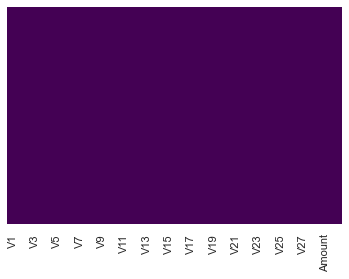

In [142]:
#Check for Missing values for Each Category
for col in data.columns:
    print(col, " — Checking")
    if data[col].isnull().values.any():
        missing_count = data[col].isnull().sum()
        print("Missing Values: ", missing_count,  "({:.2%})\n".format(missing_count/ data.shape[0]))
    else:
        print("Column does not have missing data")

sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap="viridis")


In [143]:
#Check the number of duplicates
print("Number of duplicates in the dataset:",data.duplicated().sum())

Number of duplicates in the dataset: 7


In [144]:
#Drop duplicates - its number is not that significant for the overall dataset
data.drop_duplicates(inplace=True)

In [145]:
#Mistakenly Typed Data — check whether there is any incosistency of what data was inputted
for col in data.columns:
    print(data[col].unique())
    
    
data.info()

[ 1.72526466  0.68325385  1.06797296 ... -7.13906007 -1.16920341
 -8.4618447 ]
[-1.33725592 -1.68187486 -0.65666745 ...  2.7730816   1.86341354
  6.86619841]
[ -1.01268723   0.53334934   1.02973756 ...  -6.75784507  -2.51513548
 -11.83826922]
[-0.36165646 -0.32606434  0.25389895 ...  4.44645597  5.46368065
  4.19421097]
[-1.43161112 -1.4556026  -1.17271474 ... -5.46442819 -0.29797132
 -6.9230971 ]
[-1.09868097  0.10183172  0.07323152 ... -1.71340145  1.36491804
 -3.22114665]
[-0.84227389 -0.52059037 -0.74577054 ... -6.48536541  0.7592187
 -7.55349651]
[-0.02659441  0.11403603  0.24980336 ...  3.4093948  -0.11886098
  6.01561819]
[-0.03240869 -0.60175962  1.38305708 ... -3.05349271 -2.29392142
 -2.46614344]
[ 0.21511332  0.4440112  -0.48377094 ... -6.26070551 -0.42378387
 -6.24624318]
[ 1.61895151  1.52157013 -0.78277972 ...  2.39416767  2.37587562
  2.94398522]
[-6.54046265e-01  4.99202119e-01  5.24182689e-03 ... -6.16353738e+00
 -3.24482730e+00 -6.51238934e+00]
[-1.44266462 -0.1278489

<b> Comment <b>

Fortunately, we don't have missing values. 
When it comes to duplicates, they correspond to a very very tiny percentage of the overall dataset. For this reason, I decided to drop them.
    
Because the dataset look more homogeneous in terms of different columns and data types we can focus more on exploring the distribution of the data. 

In [146]:
VisualAnalysis(data)

Because Visual Analysis library is not visible in html mode I include the screenshot
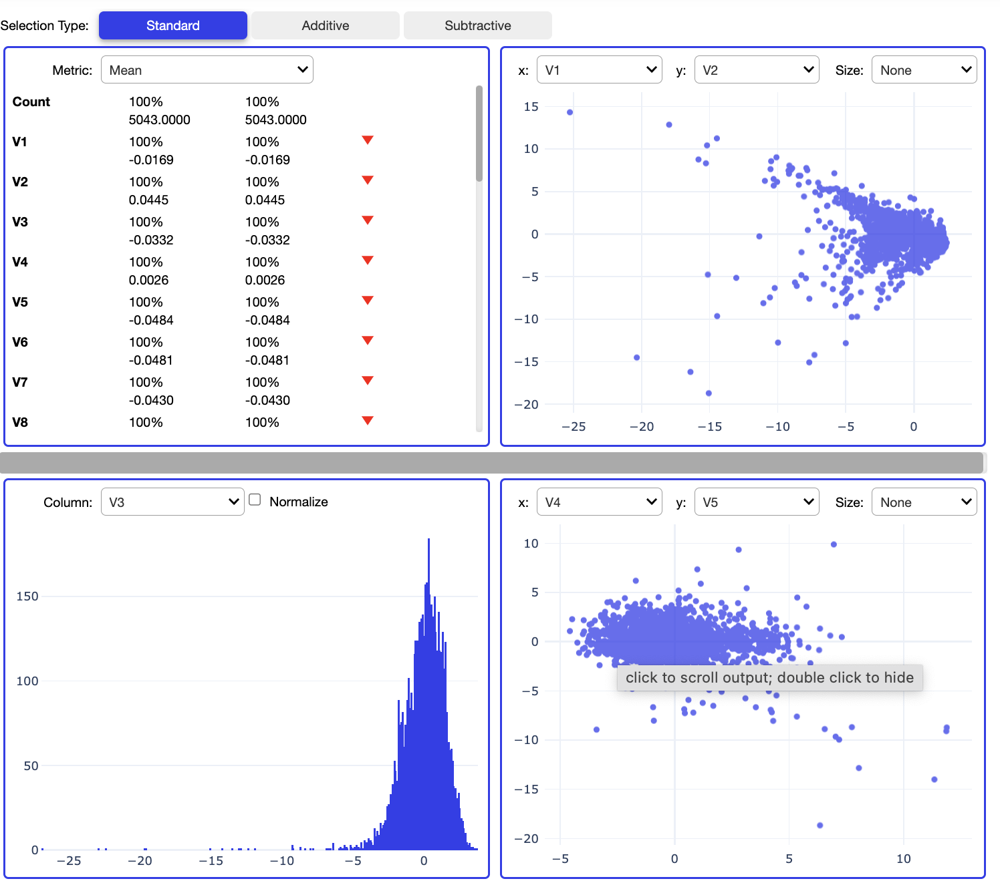

### Univariate Analysis

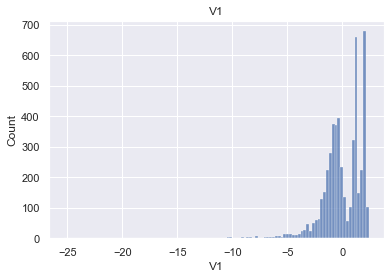

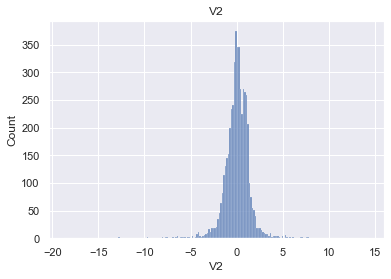

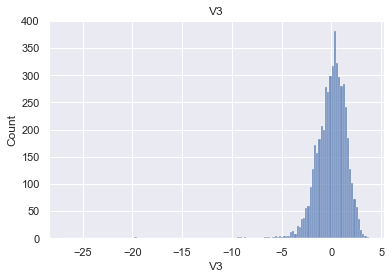

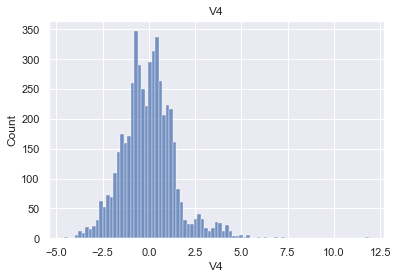

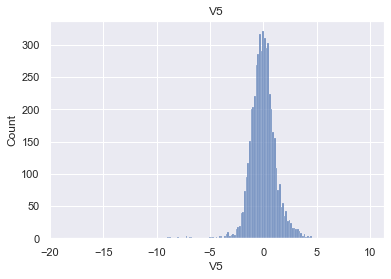

...

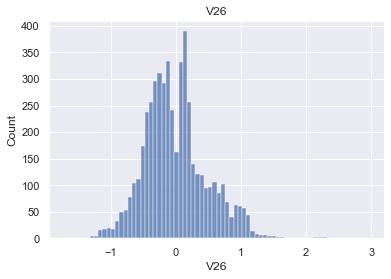

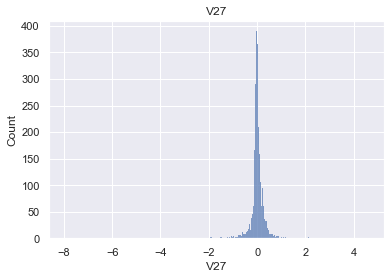

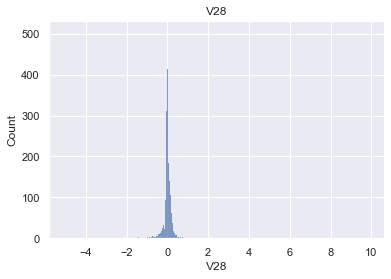

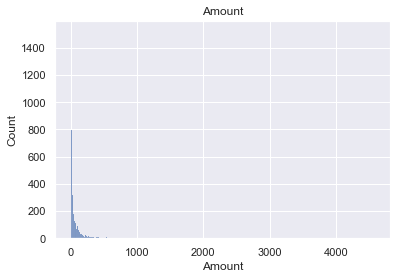

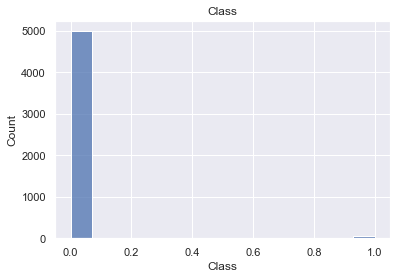

In [105]:
# Univariate Analysis for Numerical Columns
numeric_cols = data.select_dtypes(include=np.number)

# plot histogram for each numeric column
for col in numeric_cols.columns.tolist():
    sns.histplot(data[col])
    plt.title(col)
    plt.show()


Boxplots for Numerical Variables.



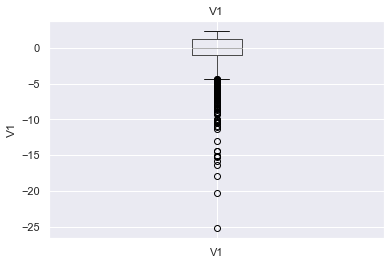

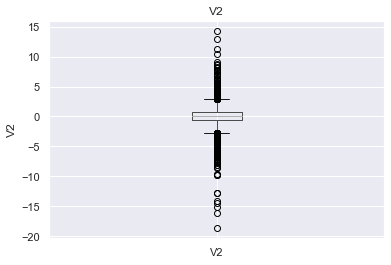

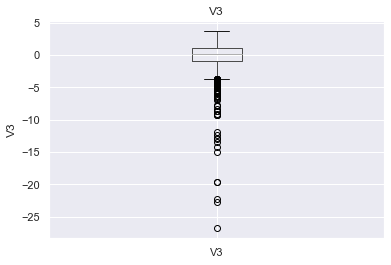

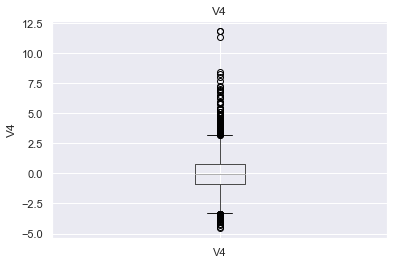

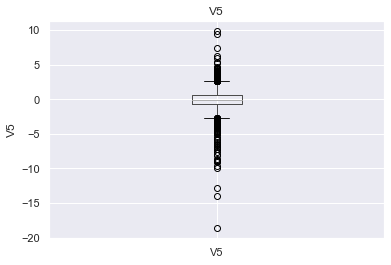

...

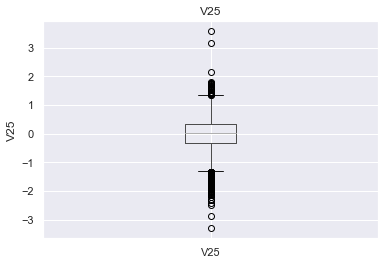

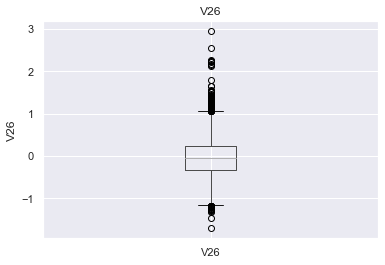

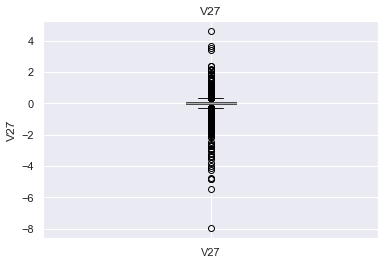

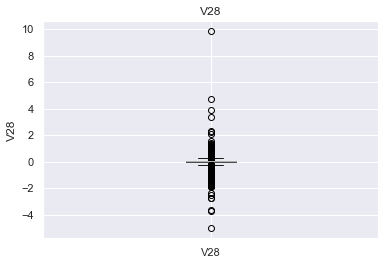

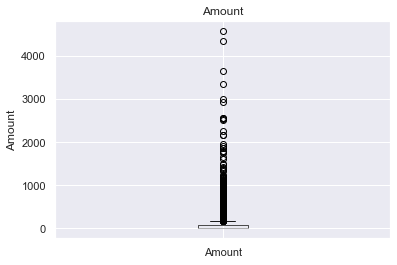

In [106]:
#Check for Numerical Columns — Outliers.
print("\nBoxplots for Numerical Variables.\n")
for column in data.drop('Class', axis=1).columns.tolist():    
    data.boxplot(column=column)
    plt.ylabel(column)
    plt.title(column)
    plt.show()

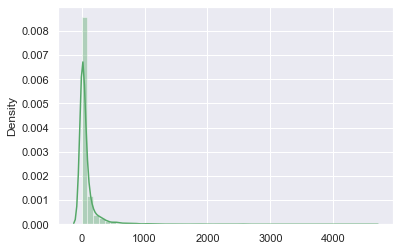

In [107]:
sns.distplot(data['Amount'].values, color='g')
plt.show()

Class Distribution: 
 0    4993
1      50
Name: Class, dtype: int64


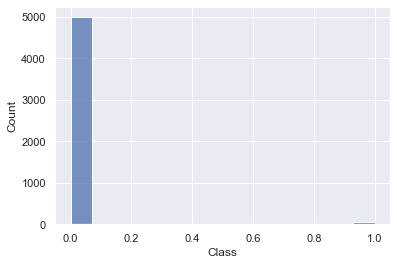

In [108]:
#Check for Dependent Variable  
#Because a huge imbalance was found this issue will be tackled after basic visualziation
sns.histplot(data=data, x="Class")
print("Class Distribution: \n", data['Class'].value_counts())

In [109]:
data.Class.value_counts()

0    4993
1      50
Name: Class, dtype: int64

<b> Comment <b>

From the histograms and boxplots, we can quickly conclude that distributions of our varaibles is not that much of a problem — they approximate the normal distribution. Yes, it can be improved via transformation but for now, I decided to stay with what we have. Theses distrubtions should not impact the model that much. As per boxplots, we can clearly detect a lot of outliers — however, because we have highly imbalanced dataset, I don't want to remove outliers but rather tackle the imbalance problem first.
    
When it comes to the "Amount" variable — different scale than the rest and is heavily right-skewed. This may be due to the following reasons: <br><br>
    1. Outliers <br><br>
    2. Floor or Ceiling Effects: In some data sets, there may be lower or upper limits that restrict the range of values that can be measured. This can result in a clustering of data points at the limit.<br><br>
    3. Exponential Growth: When a variable experiences exponential growth, it can cause a right-skewed distribution. This is because the variable will start with low values but experience rapid growth over time, resulting in a few high values that skew the distribution to the right.<br><br>
    4. Sampling Bias: Sampling bias occurs when a data set is not representative of the population from which it was drawn. If the sample is skewed to the right, the resulting data set will also be right-skewed.<br><br>
    5. Limited Precision: Limited precision can occur when data is collected using instruments that have limited measurement accuracy. This can result in a clustering of data points at certain values, leading to a right-skewed distribution.<br><br>
    
<b> Dependent Variable:<b>
    

A key conclusion: Heavy imbalance, ratio almost 1:100.
    
    
<b>Outliers:<b> 

We can detect significant amount of outliters (based on boxplot analysis). The problem here is that we don't want to remove data points because we have heavily imabalanced dataset. Removing outliers right now would exacerbate the probem.

### Bivariate Analysis

In this part I focus on interaction and association between variables. For that I use primarly pairplot. Then I want to investgate association betweeen each of the independent variablea and our dependent variable.

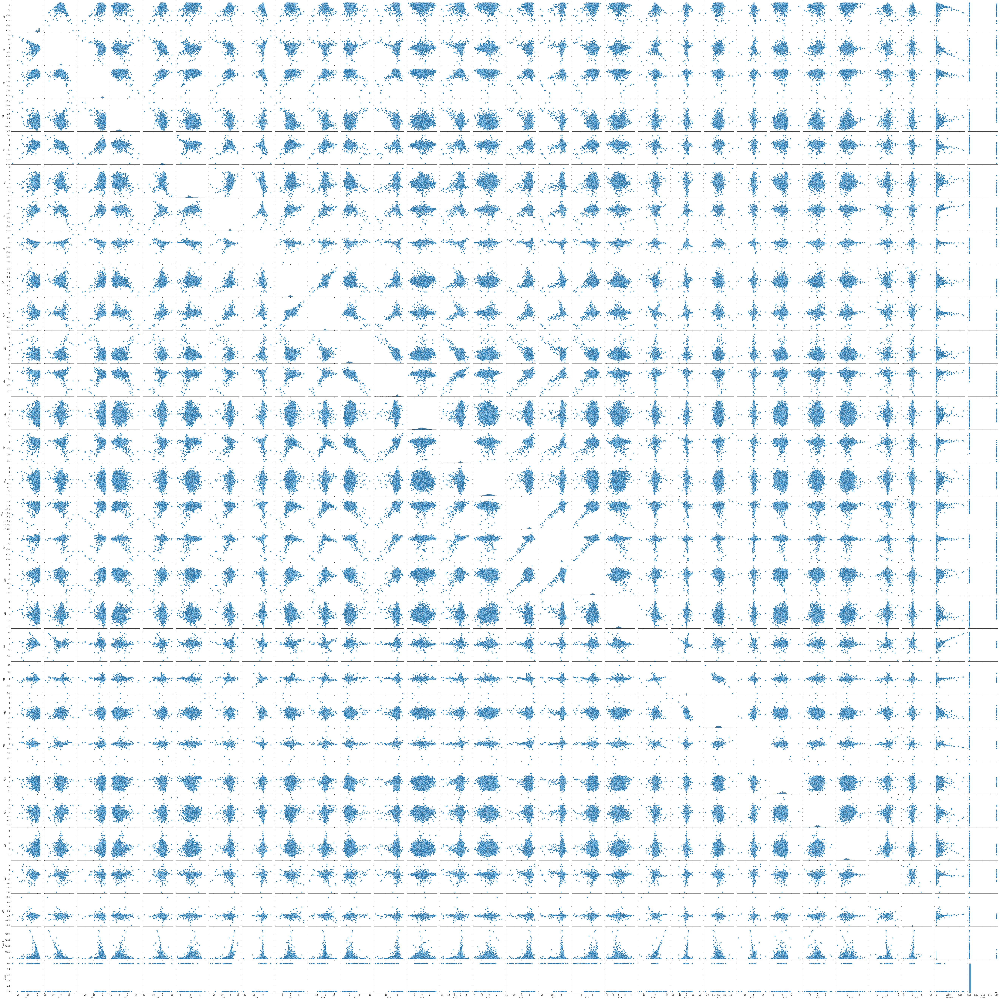

In [54]:
sns.pairplot(data)
plt.show()

### Correlation Analysis

In correlation analysis, we look for variables whose correlation coefficient will be higher than 0.8. In those cases we unnecessary use them because they provide a similiar information. On the other hand, we also look for high correlation between dependent variable and independent variables becuase it will allow to check which varaibles will provide the most information for the model.

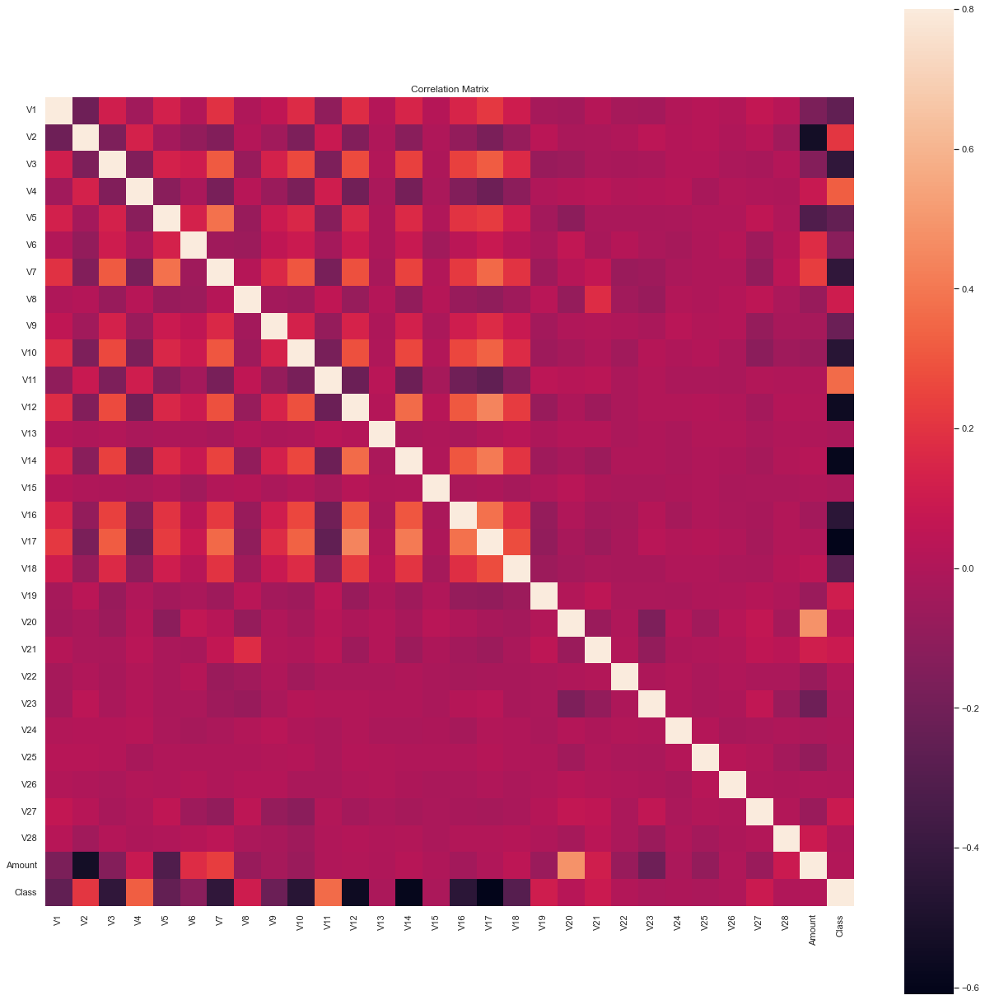

In [110]:
# Correlation Analysis
corr = data.corr()
f, ax = plt.subplots(figsize=(22, 22))
sns.heatmap(corr, vmax=.8, square=True)
plt.title('Correlation Matrix')
plt.show()

In [111]:
def correlation(dataset, threshold):
    col_corr = set()  
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: 
                colname = corr_matrix.columns[i]  
                col_corr.add(colname)
    if len(col_corr)==0:
        print("No correlation detected")
    else: print("Correlated variables: ", col_corr) 

correlation(data, 0.8)

No correlation detected


<b> Comment <b>

We don't have correlated features which is a good sign. However, we see from bivariate analysis (in general) and Correlation Matrix (more in-depth) that we have some positive correlation (in healthy ranges) which is beneficial for the model.

## Scailing & Transformation

Because most of the "V" variables are very similiar, I will apply Robust Scaler transformation on Amount variable only.

In [112]:
from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()
data['Amount'] = scaler.fit_transform(data['Amount'].values.reshape(-1,1))

In [113]:
data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1.725265,-1.337256,-1.012687,-0.361656,-1.431611,-1.098681,-0.842274,-0.026594,-0.032409,0.215113,...,0.414524,0.793434,0.028887,0.419421,-0.367529,-0.155634,-0.015768,0.010790,2.408942,0
1,0.683254,-1.681875,0.533349,-0.326064,-1.455603,0.101832,-0.520590,0.114036,-0.601760,0.444011,...,0.116898,-0.304605,-0.125547,0.244848,0.069163,-0.460712,-0.017068,0.063542,4.211113,0
2,1.067973,-0.656667,1.029738,0.253899,-1.172715,0.073232,-0.745771,0.249803,1.383057,-0.483771,...,-0.189315,-0.426743,0.079539,0.129692,0.002778,0.970498,-0.035056,0.017313,0.566062,0
3,0.119513,0.729275,-1.678879,-1.551408,3.128914,3.210632,0.356276,0.920374,-0.160589,-0.801748,...,-0.335825,-0.906171,0.108350,0.593062,-0.424303,0.164201,0.245881,0.071029,-0.277960,0
4,1.271253,0.275694,0.159568,1.003096,-0.128535,-0.608730,0.088777,-0.145336,0.156047,0.022707,...,0.031958,0.123503,-0.174528,-0.147535,0.735909,-0.262270,0.015577,0.015955,-0.197400,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,1.118331,2.074439,-3.837518,5.448060,0.071816,-1.020509,-1.808574,0.521744,-2.032638,-2.732792,...,0.289861,-0.172718,-0.021910,-0.376560,0.192817,0.114107,0.500996,0.259533,-0.276389,1
5046,-2.150855,2.187917,-3.430516,0.119476,-0.173210,0.290700,-2.808988,-2.679351,-0.556685,-4.485483,...,-0.073205,0.561496,-0.075034,-0.437619,0.353841,-0.521339,0.144465,0.026588,0.423511,1
5047,-7.139060,2.773082,-6.757845,4.446456,-5.464428,-1.713401,-6.485365,3.409395,-3.053493,-6.260706,...,1.303250,-0.016118,-0.876670,0.382230,-1.054624,-0.614606,-0.766848,0.409424,1.236252,1
5048,-1.169203,1.863414,-2.515135,5.463681,-0.297971,1.364918,0.759219,-0.118861,-2.293921,-0.423784,...,-0.393090,-0.708692,0.471309,-0.078616,-0.544655,0.014777,-0.240930,-0.781055,4.345665,1


### Solving Imbalanced Dataset Issue

Text(0, 0.5, 'Frequency')

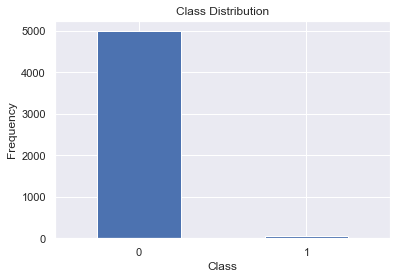

In [114]:
### Checking 
count_classes = pd.value_counts(data['Class'], sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Class Distribution")

plt.xlabel("Class")

plt.ylabel("Frequency")

<b> Comment <b> 

To solve the issue of imbalance, I decided to go with undersampling and oversampling and compare the results. I considered the following methods:
    
Techniques for Undersampling:
1. Random Sampling
2. Cluster
3. Tomek Links
4. Undersampling with ensemble learning

Techniques for Oversampling
1. Random Sampling
2. SMOTE
3. ADASYN — Improved Version of SMOTE
4. Augmentation
    
and I dedcided in both cases to choose Random Sampling. This is because it will provide the exact environment to compare the methods (Random technique in both cases).
    
    
<b> Undersampling <b>
    
Advantages:
1. Help improve the runtime of the model & solve the memory problems by reducing the number of training data 

Disadvantages:
1. Can discard useful information 
2. Possibility to choose a biased sample which can cause the model toperform poorly on real unseen data.

    
<b> Oversampling <b> 
    
Main Advantage: 
1. No information loss

Disadvantages: 
1. Possibility of overfitting since it replicates the minority class events.


In [115]:
from sklearn.model_selection import train_test_split

"""
I also wanted to run a SMOTE oversampling but do the errors of threadpoolexecutor 
I was not able to overcome internal problems of this library.
"""

data_under = data.copy()
data_over = data.copy()
data_SMOTE = data.copy()


under_target = data_under.Class
under_predictors = data_under.drop("Class", axis=1)

over_target = data_over.Class
over_predictors = data_over.drop("Class", axis=1)

SMOTE_target = data_SMOTE.Class
SMOTE_predictors = data_SMOTE.drop("Class", axis=1)

X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(under_predictors, under_target, test_size=0.3, random_state=42, stratify=under_target)
X_train_over, X_test_over, y_train_over, y_test_over = train_test_split(over_predictors, over_target, test_size=0.3, random_state=42, stratify=over_target)

X_train_SMOTE, X_test_SMOTE, y_train_SMOTE, y_test_SMOTE = train_test_split(SMOTE_predictors, SMOTE_target, test_size=0.3, random_state=42, stratify=SMOTE_target)


(array([3495.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          35.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

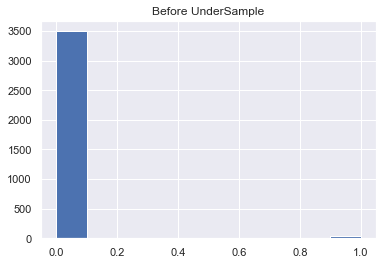

In [116]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(sampling_strategy=0.9, random_state=42)
X_resample_under, y_resample_under = rus.fit_resample(X_train_under, y_train_under)

import matplotlib
plt.title("Before UnderSample")
matplotlib.pyplot.hist(y_train_under)

Text(0.5, 1.0, 'After RandomUnderSampler')

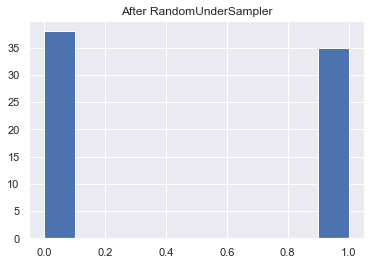

In [117]:
matplotlib.pyplot.hist(y_resample_under)
plt.title("After RandomUnderSampler")

(array([3495.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          35.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

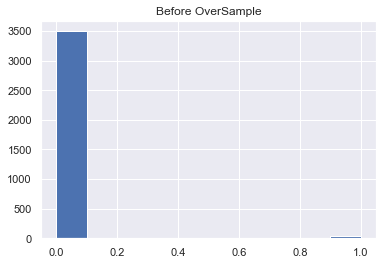

In [118]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(sampling_strategy=0.9, random_state=0)
X_resample_over, y_resample_over = ros.fit_resample(X_train_over, y_train_over)

import matplotlib
plt.title("Before OverSample")
matplotlib.pyplot.hist(y_train_over)

Text(0.5, 1.0, 'After RandomUnderSampler')

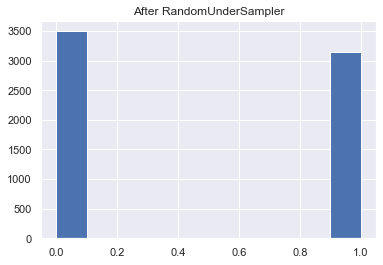

In [119]:
matplotlib.pyplot.hist(y_resample_over)
plt.title("After RandomUnderSampler")

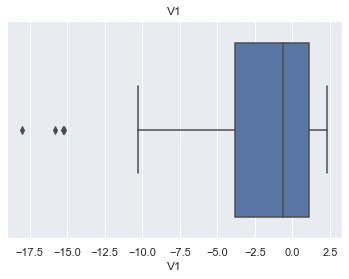

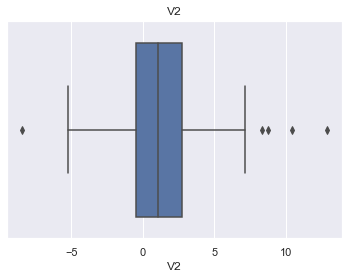

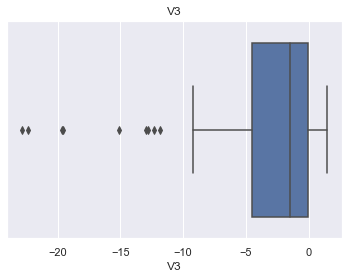

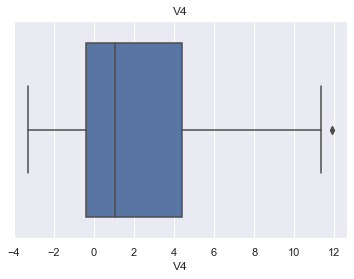

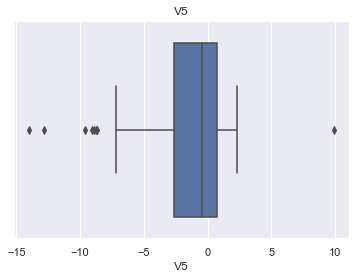

...

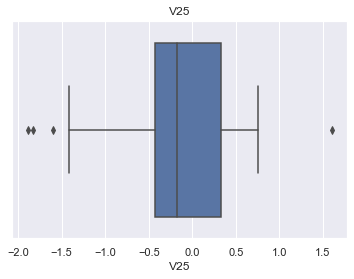

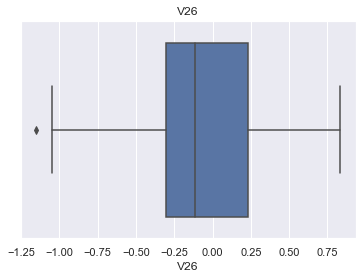

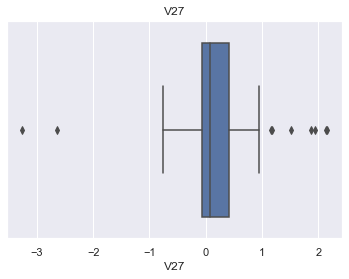

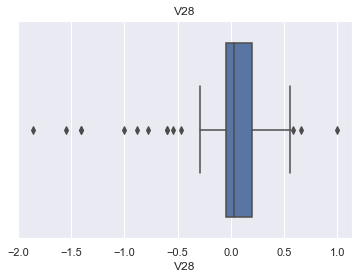

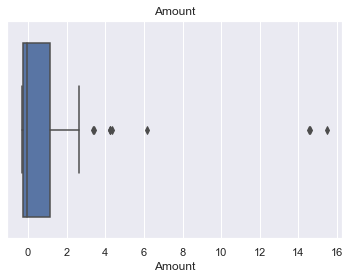

In [120]:
#Outlier Detection — Oversampling

# plot boxplot for each numeric column
for col in X_resample_under.columns:
    sns.boxplot(X_resample_under[col])
    plt.title(col)
    plt.show()

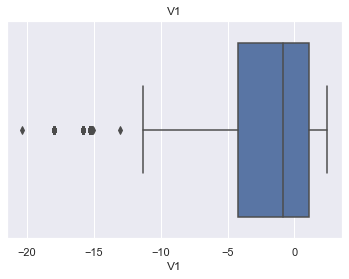

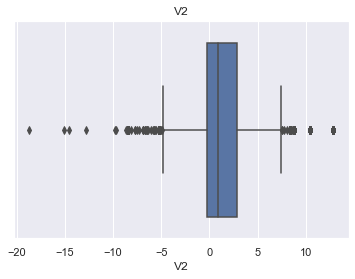

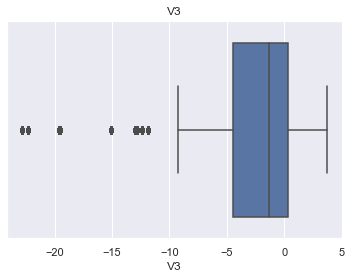

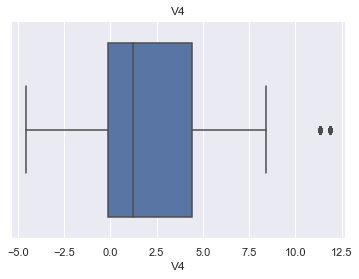

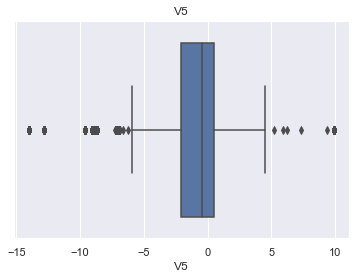

...

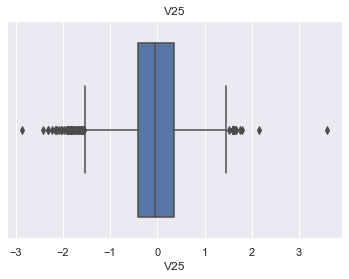

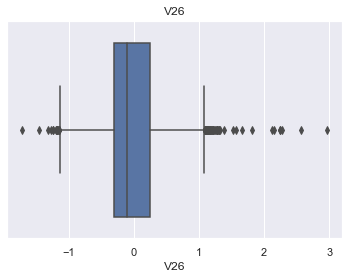

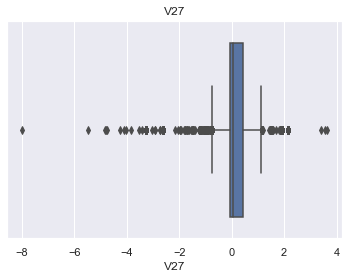

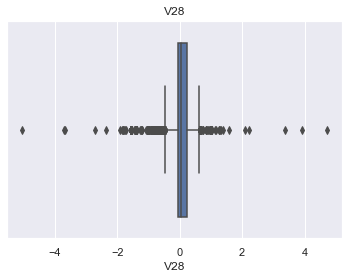

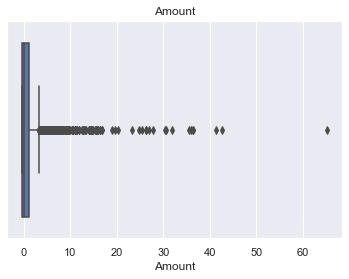

In [121]:
#Outlier Detection — Oversampling

# plot boxplot for each numeric column
for col in X_resample_over.columns:
    sns.boxplot(X_resample_over[col])
    plt.title(col)
    plt.show()

<b> Comment <b> 

I decided to drop outliers (using iterquantile range method) because in the trade-off between possible harm of outliers and dataset size, I decided to care more about the former in order to check the results without the impact of outliers. Interestingly enough undersampling produces less outliers (mainly becuase of the dataset size)

In [122]:
#Outlier Removal — Undersampling & Oversampling
columns=X_train_under.columns
new_under=pd.concat([X_resample_under, y_resample_under], axis=1)
new_over=pd.concat([X_resample_over, y_resample_over], axis=1)

def remove_outliers(dataset, column):
    q1, q3 = np.percentile(dataset[column], [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    dataset = dataset[(dataset[column] >= lower_bound) & (dataset[column] <= upper_bound)]
    return dataset   

for col in columns:
    over_without_outlier=remove_outliers(new_over, col)
    under_without_outlier=remove_outliers(new_under, col)

## Modeling — Undersampling data

In [80]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections
import warnings

warnings.filterwarnings("ignore")

In [123]:
under_target = under_without_outlier.Class
under_predictors = under_without_outlier.drop("Class", axis=1)

over_target = over_without_outlier.Class
over_predictors = over_without_outlier.drop("Class", axis=1)

X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(under_predictors, under_target, test_size=0.3, random_state=42, stratify=under_target)
X_train_over, X_test_over, y_train_over, y_test_over = train_test_split(over_predictors, over_target, test_size=0.3, random_state=42, stratify=over_target)

In [124]:
#Decision Tree
# Import necessary libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report
import warnings
warnings.filterwarnings("ignore")

# Define the Decision Tree Classifier
dtc = DecisionTreeClassifier()

# Define the hyperparameters to tune
parameters = {'criterion': ['gini', 'entropy'], 
              'max_depth': [3, 4, 5, 6], 
              'min_samples_split': [2, 3, 4, 5],
              'min_samples_leaf': [1, 2, 3]}

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(dtc, parameters, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train_under, y_train_under)

# Print the best hyperparameters found
print("Best parameters: ", grid_search.best_params_)

# Use the best hyperparameters to train the model
best_dtc = grid_search.best_estimator_
best_dtc.fit(X_train_under, y_train_under)

# Predict the classes and probabilities on the test set
y_pred = best_dtc.predict(X_test_under)
y_proba = best_dtc.predict_proba(X_test_under)[:, 1]

# Compute the F1 score and AUC-ROC score
f1 = f1_score(y_test_under, y_pred)
auc_roc = roc_auc_score(y_test_under, y_proba)

# Print the F1 score and AUC-ROC score
print("F1 score: ", f1)
print("AUC-ROC score: ", auc_roc)

# Print the classification report
class_report = classification_report(y_test_under, y_pred)
print("Classification Report:\n", class_report)

/Users/bartekrzycki/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/bartekrzycki/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/bartekrzycki/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/bartekrzycki/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected v

Best parameters:  {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3}
F1 score:  0.8750000000000001
AUC-ROC score:  0.8888888888888888
Classification Report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92        11
           1       1.00      0.78      0.88         9

    accuracy                           0.90        20
   macro avg       0.92      0.89      0.90        20
weighted avg       0.92      0.90      0.90        20



In [125]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Logistic Regression model
lr = LogisticRegression(random_state=42)

# Define the hyperparameter grid to search over
param_grid = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}

# Use GridSearchCV to find the best hyperparameters
lr_grid = GridSearchCV(lr, param_grid, scoring='roc_auc', cv=5)
lr_grid.fit(X_train_under, y_train_under)

# Train the model with the best hyperparameters
lr_best = LogisticRegression(random_state=42, **lr_grid.best_params_)
lr_best.fit(X_train_under, y_train_under)

# Make predictions on the test set
y_pred = lr_best.predict(X_test_under)
y_pred_proba = lr_best.predict_proba(X_test_under)[:,1] # probability scores for class 1

# Compute the evaluation metrics
f1 = f1_score(y_test_under, y_pred)
auc_roc = roc_auc_score(y_test_under, y_pred_proba)
report = classification_report(y_test_under, y_pred)

# Print the evaluation metrics
print("F1 score:", f1)
print("AUC-ROC score:", auc_roc)
print("Classification report:\n", report)


F1 score: 0.9411764705882353
AUC-ROC score: 0.9797979797979797
Classification report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96        11
           1       1.00      0.89      0.94         9

    accuracy                           0.95        20
   macro avg       0.96      0.94      0.95        20
weighted avg       0.95      0.95      0.95        20



In [85]:
#Random Forest
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Random Forest Classifier
rfc = RandomForestClassifier()

# Define the hyperparameters to tune
parameters = {'n_estimators': [50, 100, 200, 500],
              'criterion': ['gini', 'entropy'], 
              'max_depth': [3, 4, 5, 6], 
              'min_samples_split': [2, 3, 4, 5],
              'min_samples_leaf': [1, 2, 3]}

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(rfc, parameters, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train_under, y_train_under)

# Print the best hyperparameters found
print("Best parameters: ", grid_search.best_params_)

# Use the best hyperparameters to train the model
best_rfc = grid_search.best_estimator_
best_rfc.fit(X_train_under, y_train_under)

# Predict the classes and probabilities on the test set
y_pred = best_rfc.predict(X_test_under)
y_proba = best_rfc.predict_proba(X_test_under)[:, 1]

# Compute the F1 score and AUC-ROC score
f1 = f1_score(y_test_under, y_pred)
auc_roc = roc_auc_score(y_test_under, y_proba)

# Print the F1 score and AUC-ROC score
print("F1 score: ", f1)
print("AUC-ROC score: ", auc_roc)

# Print the classification report
class_report = classification_report(y_test_under, y_pred)
print("Classification Report:\n", class_report)


Best parameters:  {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
F1 score:  0.9411764705882353
AUC-ROC score:  0.8939393939393938
Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96        11
           1       1.00      0.89      0.94         9

    accuracy                           0.95        20
   macro avg       0.96      0.94      0.95        20
weighted avg       0.95      0.95      0.95        20



In [86]:
#Gradient Boosting
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Gradient Boosting model
gbc = GradientBoostingClassifier(random_state=42)

# Define the hyperparameter grid to search over
param_grid = {'learning_rate': [0.01, 0.1, 1],
              'n_estimators': [50, 100, 200],
              'max_depth': [3, 4, 5]}

# Use GridSearchCV to find the best hyperparameters
gbc_grid = GridSearchCV(gbc, param_grid, scoring='roc_auc', cv=5)
gbc_grid.fit(X_train_under, y_train_under)

# Train the model with the best hyperparameters
gbc_best = GradientBoostingClassifier(random_state=42, **gbc_grid.best_params_)
gbc_best.fit(X_train_under, y_train_under)

# Make predictions on the test set
y_pred = gbc_best.predict(X_test_under)
y_pred_proba = gbc_best.predict_proba(X_test_under)[:,1] # probability scores for class 1

# Compute the evaluation metrics
f1 = f1_score(y_test_under, y_pred)
auc_roc = roc_auc_score(y_test_under, y_pred_proba)
report = classification_report(y_test_under, y_pred)

# Print the evaluation metrics
print("F1 score:", f1)
print("AUC-ROC score:", auc_roc)
print("Classification report:\n", report)


F1 score: 0.8750000000000001
AUC-ROC score: 0.8888888888888888
Classification report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92        11
           1       1.00      0.78      0.88         9

    accuracy                           0.90        20
   macro avg       0.92      0.89      0.90        20
weighted avg       0.92      0.90      0.90        20



In [87]:
#XGBoost
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV

# Define XGBoost classifier
xgb = XGBClassifier()

# Define parameter grid for hyperparameter tuning
param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators": [100, 500, 1000],
    "max_depth": [3, 5, 7]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, scoring='f1')

# Fit the grid search to the training data
grid_search.fit(X_train_under, y_train_under)

# Get the best parameters and score from the grid search
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and score
print("Best parameters: ", best_params)
print("Best score: ", best_score)

# Train the XGBoost classifier with the best parameters
xgb_best = XGBClassifier(**best_params)
xgb_best.fit(X_train_under, y_train_under)

# Make predictions on the test set
y_pred = xgb_best.predict(X_test_under)
y_proba = xgb_best.predict_proba(X_test_under)[:,1]

# Calculate evaluation metrics
f1 = f1_score(y_test_under, y_pred)
roc_auc = roc_auc_score(y_test_under, y_proba)
class_report = classification_report(y_test_under, y_pred)

# Print evaluation metrics
print("F1 Score:", f1)
print("AUC-ROC Score:", roc_auc)
print("Classification Report:", class_report)


Best parameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
Best score:  0.9777777777777779
F1 Score: 0.8750000000000001
AUC-ROC Score: 0.8888888888888888
Classification Report:               precision    recall  f1-score   support

           0       0.85      1.00      0.92        11
           1       1.00      0.78      0.88         9

    accuracy                           0.90        20
   macro avg       0.92      0.89      0.90        20
weighted avg       0.92      0.90      0.90        20



In [127]:
#LightGMB
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV

# Define LightGBM classifier
lgbm = lgb.LGBMClassifier()

# Define parameter grid for hyperparameter tuning
param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators": [100, 500, 1000],
    "max_depth": [3, 5, 7]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(lgbm, param_grid=param_grid, cv=5, scoring='f1')

# Fit the grid search to the training data
grid_search.fit(X_train_under, y_train_under)

# Get the best parameters and score from the grid search
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and score
print("Best parameters: ", best_params)
print("Best score: ", best_score)

# Train the LightGBM classifier with the best parameters
lgbm_best = lgb.LGBMClassifier(**best_params)
lgbm_best.fit(X_train_under, y_train_under)

# Make predictions on the test set
y_pred = lgbm_best.predict(X_test_under)
y_proba = lgbm_best.predict_proba(X_test_under)[:,1]

# Calculate evaluation metrics
f1 = f1_score(y_test_under, y_pred)
roc_auc = roc_auc_score(y_test_under, y_proba)
class_report = classification_report(y_test_under, y_pred)

# Print evaluation metrics
print("F1 Score:", f1)
print("AUC-ROC Score:", roc_auc)
print("Classification Report:", class_report)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [132]:
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_curve

log_reg_pred = cross_val_predict(lr_best, X_train_under, y_train_under, cv=5,
                             method="decision_function")

best_rfc_pred=cross_val_predict(best_rfc, X_train_under, y_train_under, cv=5)

gbc_best_pred = cross_val_predict(gbc_best, X_train_under, y_train_under, cv=5)
xgb_best_pred = cross_val_predict(xgb_best, X_train_under, y_train_under, cv=5)

lgbm_best_pred = cross_val_predict(lgbm_best, X_train_under, y_train_under, cv=5)

tree_pred_pred = cross_val_predict(best_dtc, X_train_under, y_train_under, cv=5)

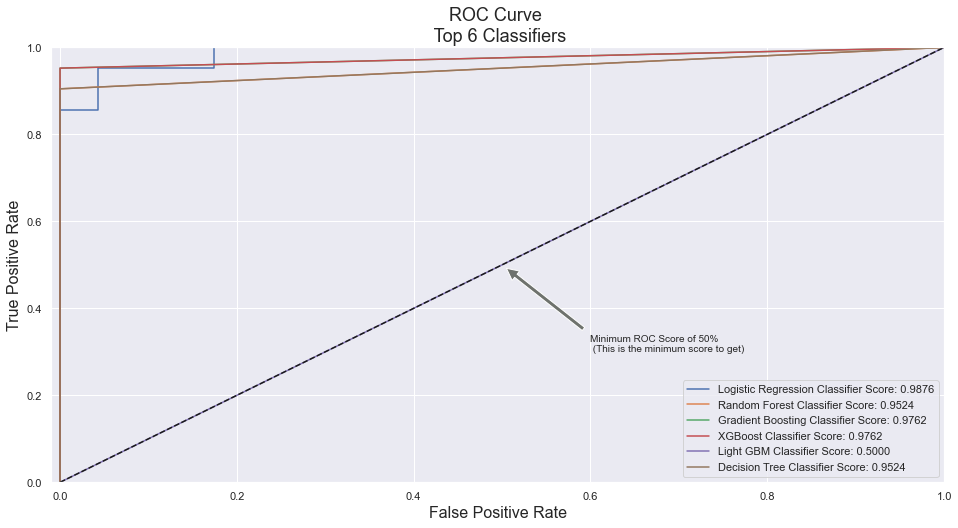

In [134]:
"""
The code below is created by author of this submission to Kaggle. It serves an inspiration.
Source: https://www.kaggle.com/code/janiobachmann/credit-fraud-dealing-with-imbalanced-datasets

"""

log_fpr, log_tpr, log_thresold = roc_curve(y_train_under, log_reg_pred)
rfc_fpr, rfc_tpr, rfc_threshold = roc_curve(y_train_under, best_rfc_pred)
gbc_fpr, gbc_tpr, gbc_threshold = roc_curve(y_train_under, gbc_best_pred)
xgb_fpr, xgb_tpr, xgb_threshold = roc_curve(y_train_under, xgb_best_pred)
lgbm_fpr, lgbm_tpr, lgbm_threshold = roc_curve(y_train_under, lgbm_best_pred)
tree_fpr, tree_tpr, tree_threshold = roc_curve(y_train_under, tree_pred_pred)


def graph_roc_curve_multiple(log_fpr, log_tpr, rfc_fpr, rfc_tpr, gbc_fpr, gbc_tpr, xgb_fpr, xgb_tpr, lgbm_fpr, lgbm_tpr, tree_fpr, tree_tpr):
    plt.figure(figsize=(16,8))
    plt.title('ROC Curve \n Top 6 Classifiers', fontsize=18)
    plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, log_reg_pred)))
    plt.plot(rfc_fpr, rfc_tpr, label='Random Forest Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, best_rfc_pred)))
    plt.plot(gbc_fpr, gbc_tpr, label='Gradient Boosting Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, gbc_best_pred)))
    plt.plot(xgb_fpr, xgb_tpr, label='XGBoost Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, gbc_best_pred)))
    plt.plot(lgbm_fpr, lgbm_tpr, label='Light GBM Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, lgbm_best_pred)))
    plt.plot(tree_fpr, tree_tpr, label='Decision Tree Classifier Score: {:.4f}'.format(roc_auc_score(y_train_under, tree_pred_pred)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()
    
graph_roc_curve_multiple(log_fpr, log_tpr, rfc_fpr, rfc_tpr, gbc_fpr, gbc_tpr, xgb_fpr, xgb_tpr, lgbm_fpr, lgbm_tpr, tree_fpr, tree_tpr)
plt.show()


### Modeling — Oversampling data

In [88]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Decision Tree Classifier
dtc = DecisionTreeClassifier()

# Define the hyperparameters to tune
parameters = {'criterion': ['gini', 'entropy'], 
              'max_depth': [3, 4, 5, 6], 
              'min_samples_split': [2, 3, 4, 5],
              'min_samples_leaf': [1, 2, 3]}

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(dtc, parameters, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train_over, y_train_over)

# Print the best hyperparameters found
print("Best parameters: ", grid_search.best_params_)

# Use the best hyperparameters to train the model
best_dtc = grid_search.best_estimator_
best_dtc.fit(X_train_over, y_train_over)

# Predict the classes and probabilities on the test set
y_pred = best_dtc.predict(X_test_over)
y_proba = best_dtc.predict_proba(X_test_over)[:, 1]

# Compute the F1 score and AUC-ROC score
f1 = f1_score(y_test_over, y_pred)
auc_roc = roc_auc_score(y_test_over, y_proba)

# Print the F1 score and AUC-ROC score
print("F1 score: ", f1)
print("AUC-ROC score: ", auc_roc)

# Print the classification report
class_report = classification_report(y_test_over, y_pred)
print("Classification Report:\n", class_report)

Best parameters:  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 3, 'min_samples_split': 5}
F1 score:  0.997539975399754
AUC-ROC score:  0.9988910263953625
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       964
           1       1.00      1.00      1.00       811

    accuracy                           1.00      1775
   macro avg       1.00      1.00      1.00      1775
weighted avg       1.00      1.00      1.00      1775



In [89]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Logistic Regression model
lr = LogisticRegression(random_state=42)

# Define the hyperparameter grid to search over
param_grid = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}

# Use GridSearchCV to find the best hyperparameters
lr_grid = GridSearchCV(lr, param_grid, scoring='roc_auc', cv=5)
lr_grid.fit(X_train_over, y_train_over)

# Train the model with the best hyperparameters
lr_best = LogisticRegression(random_state=42, **lr_grid.best_params_)
lr_best.fit(X_train_over, y_train_over)

# Make predictions on the test set
y_pred = lr_best.predict(X_test_over)
y_pred_proba = lr_best.predict_proba(X_test_over)[:,1] # probability scores for class 1

# Compute the evaluation metrics
f1 = f1_score(y_test_over, y_pred)
auc_roc = roc_auc_score(y_test_over, y_pred_proba)
report = classification_report(y_test_over, y_pred)

# Print the evaluation metrics
print("F1 score:", f1)
print("AUC-ROC score:", auc_roc)
print("Classification report:\n", report)


F1 score: 0.9981538461538462
AUC-ROC score: 0.999279870658119
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       964
           1       1.00      1.00      1.00       811

    accuracy                           1.00      1775
   macro avg       1.00      1.00      1.00      1775
weighted avg       1.00      1.00      1.00      1775



In [90]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Random Forest Classifier
rfc = RandomForestClassifier()

# Define the hyperparameters to tune
parameters = {'n_estimators': [50, 100, 200, 500],
              'criterion': ['gini', 'entropy'], 
              'max_depth': [3, 4, 5, 6], 
              'min_samples_split': [2, 3, 4, 5],
              'min_samples_leaf': [1, 2, 3]}

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(rfc, parameters, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train_over, y_train_over)

# Print the best hyperparameters found
print("Best parameters: ", grid_search.best_params_)

# Use the best hyperparameters to train the model
best_rfc = grid_search.best_estimator_
best_rfc.fit(X_train_over, y_train_over)

# Predict the classes and probabilities on the test set
y_pred = best_rfc.predict(X_test_over)
y_proba = best_rfc.predict_proba(X_test_over)[:, 1]

# Compute the F1 score and AUC-ROC score
f1 = f1_score(y_test_over, y_pred)
auc_roc = roc_auc_score(y_test_over, y_proba)

# Print the F1 score and AUC-ROC score
print("F1 score: ", f1)
print("AUC-ROC score: ", auc_roc)

# Print the classification report
class_report = classification_report(y_test_over, y_pred)
print("Classification Report:\n", class_report)


Best parameters:  {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
F1 score:  0.9993838570548367
AUC-ROC score:  0.9991992878010345
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       964
           1       1.00      1.00      1.00       811

    accuracy                           1.00      1775
   macro avg       1.00      1.00      1.00      1775
weighted avg       1.00      1.00      1.00      1775



In [91]:
#Gradient Boosting

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, roc_auc_score, classification_report

# Define the Gradient Boosting model
gbc = GradientBoostingClassifier(random_state=42)

# Define the hyperparameter grid to search over
param_grid = {'learning_rate': [0.01, 0.1, 1],
              'n_estimators': [50, 100, 200],
              'max_depth': [3, 4, 5]}

# Use GridSearchCV to find the best hyperparameters
gbc_grid = GridSearchCV(gbc, param_grid, scoring='roc_auc', cv=5)
gbc_grid.fit(X_train_over, y_train_over)

# Train the model with the best hyperparameters
gbc_best = GradientBoostingClassifier(random_state=42, **gbc_grid.best_params_)
gbc_best.fit(X_train_over, y_train_over)

# Make predictions on the test set
y_pred = gbc_best.predict(X_test_over)
y_pred_proba = gbc_best.predict_proba(X_test_over)[:,1] # probability scores for class 1

# Compute the evaluation metrics
f1 = f1_score(y_test_over, y_pred)
auc_roc = roc_auc_score(y_test_over, y_pred_proba)
report = classification_report(y_test_over, y_pred)

# Print the evaluation metrics
print("F1 score:", f1)
print("AUC-ROC score:", auc_roc)
print("Classification report:\n", report)


F1 score: 0.9993838570548367
AUC-ROC score: 0.9991289376877069
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       964
           1       1.00      1.00      1.00       811

    accuracy                           1.00      1775
   macro avg       1.00      1.00      1.00      1775
weighted avg       1.00      1.00      1.00      1775



In [92]:
#XGBoost
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV

# Define XGBoost classifier
xgb = XGBClassifier()

# Define parameter grid for hyperparameter tuning
param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators": [100, 500, 1000],
    "max_depth": [3, 5, 7]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, scoring='f1')

# Fit the grid search to the training data
grid_search.fit(X_train_over, y_train_over)

# Get the best parameters and score from the grid search
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and score
print("Best parameters: ", best_params)
print("Best score: ", best_score)

# Train the XGBoost classifier with the best parameters
xgb_best = XGBClassifier(**best_params)
xgb_best.fit(X_train_over, y_train_over)

# Make predictions on the test set
y_pred = xgb_best.predict(X_test_over)
y_proba = xgb_best.predict_proba(X_test_over)[:,1]

# Calculate evaluation metrics
f1 = f1_score(y_test_over, y_pred)
roc_auc = roc_auc_score(y_test_over, y_proba)
class_report = classification_report(y_test_over, y_pred)

# Print evaluation metrics
print("F1 Score:", f1)
print("AUC-ROC Score:", roc_auc)
print("Classification Report:", class_report)


Best parameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best score:  0.9989445901105787
F1 Score: 0.9993838570548367
AUC-ROC Score: 0.9993732444448993
Classification Report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00       964
           1       1.00      1.00      1.00       811

    accuracy                           1.00      1775
   macro avg       1.00      1.00      1.00      1775
weighted avg       1.00      1.00      1.00      1775



In [135]:
#LightGMB
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV

# Define LightGBM classifier
lgbm = lgb.LGBMClassifier()

# Define parameter grid for hyperparameter tuning
param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators": [100, 500, 1000],
    "max_depth": [3, 5, 7]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(lgbm, param_grid=param_grid, cv=5, scoring='f1')

# Fit the grid search to the training data
grid_search.fit(X_train_over, y_train_over)

# Get the best parameters and score from the grid search
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and score
print("Best parameters: ", best_params)
print("Best score: ", best_score)

# Train the LightGBM classifier with the best parameters
lgbm_best = lgb.LGBMClassifier(**best_params)
lgbm_best.fit(X_train_over, y_train_over)

# Make predictions on the test set
y_pred = lgbm_best.predict(X_test_over)
y_proba = lgbm_best.predict_proba(X_test_over)[:,1]

# Calculate evaluation metrics
f1 = f1_score(y_test_over, y_pred)
roc_auc = roc_auc_score(y_test_over, y_proba)
class_report = classification_report(y_test_over, y_pred)

# Print evaluation metrics
print("F1 Score:", f1)
print("AUC-ROC Score:", roc_auc)
print("Classification Report:", class_report)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


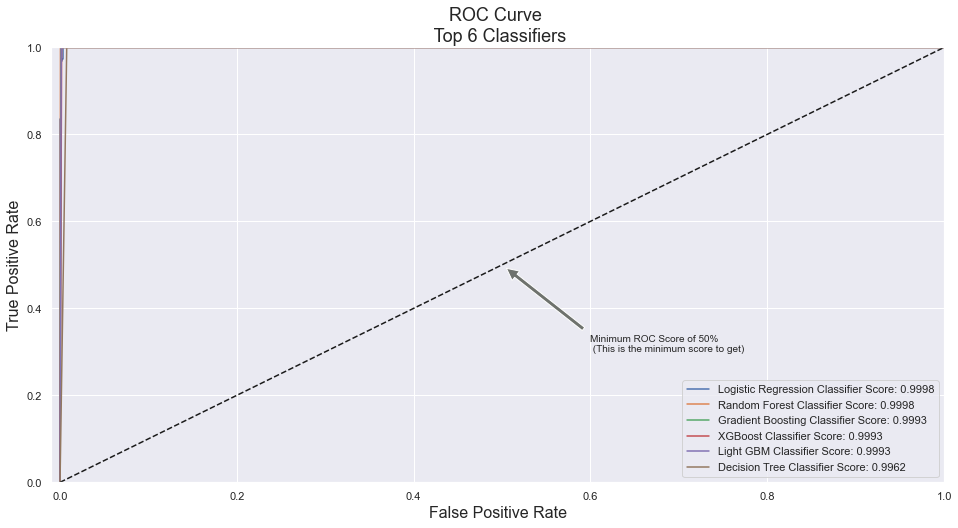

In [136]:
log_reg_pred = cross_val_predict(lr_best, X_train_over, y_train_over, cv=5,
                             method="decision_function")

best_rfc_pred=cross_val_predict(best_rfc, X_train_over, y_train_over, cv=5)

gbc_best_pred = cross_val_predict(gbc_best, X_train_over, y_train_over, cv=5)
xgb_best_pred = cross_val_predict(xgb_best, X_train_over, y_train_over, cv=5)

lgbm_best_pred = cross_val_predict(lgbm_best, X_train_over, y_train_over, cv=5)

tree_pred_pred = cross_val_predict(best_dtc, X_train_over, y_train_over, cv=5)


log_fpr, log_tpr, log_thresold = roc_curve(y_train_over, log_reg_pred)
rfc_fpr, rfc_tpr, rfc_threshold = roc_curve(y_train_over, best_rfc_pred)
gbc_fpr, gbc_tpr, gbc_threshold = roc_curve(y_train_over, gbc_best_pred)
xgb_fpr, xgb_tpr, xgb_threshold = roc_curve(y_train_over, xgb_best_pred)
lgbm_fpr, lgbm_tpr, lgbm_threshold = roc_curve(y_train_over, lgbm_best_pred)
tree_fpr, tree_tpr, tree_threshold = roc_curve(y_train_over, tree_pred_pred)


def graph_roc_curve_multiple(log_fpr, log_tpr, rfc_fpr, rfc_tpr, gbc_fpr, gbc_tpr, xgb_fpr, xgb_tpr, lgbm_fpr, lgbm_tpr, tree_fpr, tree_tpr):
    plt.figure(figsize=(16,8))
    plt.title('ROC Curve \n Top 6 Classifiers', fontsize=18)
    plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, log_reg_pred)))
    plt.plot(rfc_fpr, rfc_tpr, label='Random Forest Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, best_rfc_pred)))
    plt.plot(gbc_fpr, gbc_tpr, label='Gradient Boosting Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, gbc_best_pred)))
    plt.plot(xgb_fpr, xgb_tpr, label='XGBoost Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, gbc_best_pred)))
    plt.plot(lgbm_fpr, lgbm_tpr, label='Light GBM Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, lgbm_best_pred)))
    plt.plot(tree_fpr, tree_tpr, label='Decision Tree Classifier Score: {:.4f}'.format(roc_auc_score(y_train_over, tree_pred_pred)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()
    
graph_roc_curve_multiple(log_fpr, log_tpr, rfc_fpr, rfc_tpr, gbc_fpr, gbc_tpr, xgb_fpr, xgb_tpr, lgbm_fpr, lgbm_tpr, tree_fpr, tree_tpr)
plt.show()


<b> Comment — Results <b>

Summarize the result we can define the end results:


Undersampling (F1 Score):
1. Decision Tree: 0.92
2. Logistic Regression: 0.94
3. Random Forest: 0.94
4. Gradient Boosting: 0.88
5. XGBoost: 0.88
6. LightGBM: 0.72

Oversampling (F1 Score):
1. Decision Tree: 0.99
2. Logistic Regression: 0.99
3. Random Forest: 0.99
4. Gradient Boosting: 0.99
5. XGBoost: 0.99
6. LightGBM: 0.99


The conclusions: 
1. Not always the most advanced models are the best — Decision tree, Random Forest, and Logistic Regression performed really good while their time of training was much lower than that of other models. 
2. LightGBM performed poorly — in my opinion, if I dedicate more time to tweak parameters, there is still a margin for improvement. 
3. In Oversampling dataset, we can probably suspect an overfitting. The reasons behind that may be that while oversampling with a very high strategy of random oversampler (increase ratio as much as possible), there is a chance of overfitting since it replicates the minority class events
